<a href="https://colab.research.google.com/github/dhuynh1182/rat1.2/blob/main/Project3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [225]:

%pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.4/660.4 kB 9.6 MB/s eta 0:00:00


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


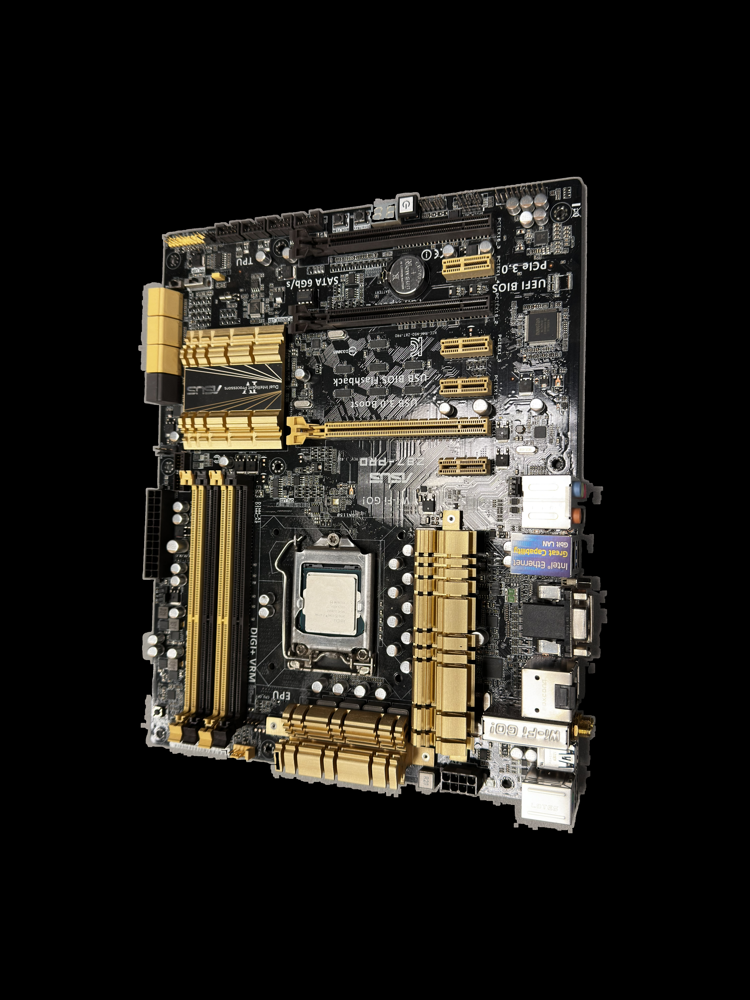

In [226]:
import cv2
import numpy as np
import PIL
import torch
from google.colab.patches import cv2_imshow

from matplotlib import pyplot as plt

#mounting drive to colab
from google.colab import drive

drive.mount('/content/drive')
path = "/content/drive/MyDrive/motherboard_image.JPEG"

img_real = cv2.imread(path, cv2.IMREAD_COLOR)

img = cv2.imread(path, cv2.IMREAD_COLOR)
img = cv2.GaussianBlur(img, (47, 47), 4)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_gray = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 55,6)



edges = cv2.Canny(img_gray, 50, 300)
edges = cv2.dilate(edges,None, iterations = 10)

contours, cat = cv2.findContours(edges,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

contour_img = np.zeros_like(img_real)

cv2.drawContours(image=contour_img, contours=[max(contours, key = cv2.contourArea)], contourIdx=-1, color=(255, 255, 255), thickness= cv2.FILLED)

masked_img = cv2.bitwise_and(contour_img,  img_real)

cv2_imshow(masked_img)


